In [1]:
# Packages necessary for this notebook
import numpy             as np
import pandas            as pd
import xarray            as xr
import seaborn           as sns
import cartopy.crs       as crs
import cartopy.feature   as cfeature
import matplotlib
import matplotlib.pyplot as plt

C:\ProgramData\Anaconda3\lib\site-packages\dask\config.py:168: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}
C:\ProgramData\Anaconda3\lib\site-packages\distributed\config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [2]:
# Import the NOAA data from 1981-2019
NOAA = xr.open_dataset(r'D:\CRI_Modelling_PC\Netcdf Data\NOAA\sst.day.mean.PacCst.1981-2019.nc')

In [3]:
# Put in your temperature ranges here:
# All temperatures in Celcius
min_Temp = 12.5
max_Temp = 16

In [4]:
# Get lat and lon data
lat = NOAA.lat.data
lon = NOAA.lon.data

In [5]:
# Constrain data to 1982 - 2018
NOAA_years = np.where((pd.DatetimeIndex(NOAA.time.data).year>=1982) & (pd.DatetimeIndex(NOAA.time.data).year<=2018))
NOAA_short = NOAA.sst[(NOAA_years[0]),:,:]

In [6]:
# Create a mask for land, count the days, and average them over years
NOAA_Mask  = NOAA.sst.where(NOAA.sst.isnull(), 1)
NOAA_Count = NOAA_short.where((NOAA_short <= max_Temp) & (NOAA_short >= min_Temp)).groupby('time.year').count(dim='time')
count_Mean = NOAA_Count.mean(dim="year")
NOAA_Final = count_Mean*NOAA_Mask[0,:,:]

In [7]:
# Standard deviation data. We might change this, but for now this works
std_Dev = NOAA_Count.std(dim="year")*NOAA_Mask[0,:,:]

In [8]:
# Just for getting state lines 
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')

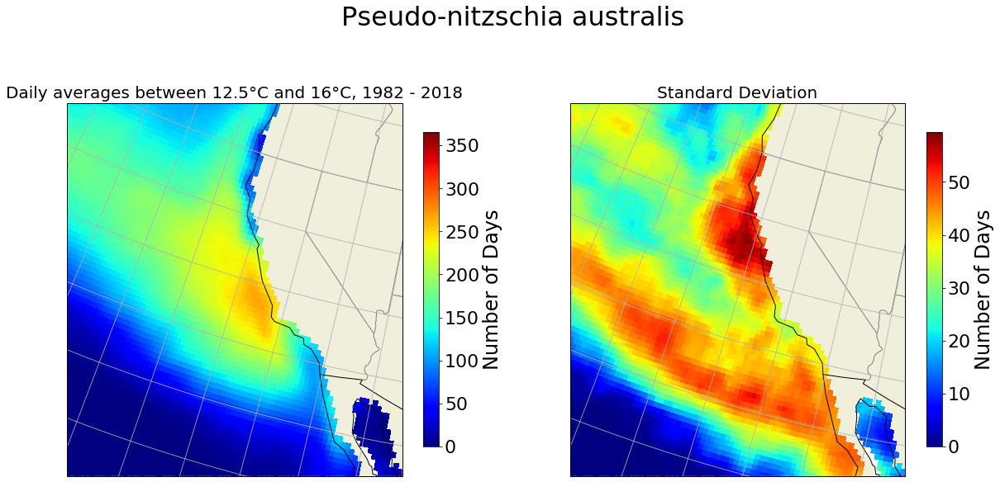

In [9]:
# Creating a figure, change name to species name
fig = plt.figure(figsize=[20,10])
fig.suptitle('Pseudo-nitzschia australis',fontsize=32)

# Plot the count_Mean data
NOAA_Plot = fig.add_subplot(1,2,1,projection=crs.LambertConformal())
NOAA_Plot.set_title('Daily averages between ' + str(min_Temp) + '\u00b0C and ' + str(max_Temp) + '\u00b0C, 1982 - 2018', fontsize=20)
NOAA_Plot.set_extent([230,245,28,43], crs.Geodetic())
NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, NOAA_Final.data,
             transform=crs.PlateCarree(),
             cmap='jet',vmax=365)
NOAA_Plot.add_feature(cfeature.COASTLINE)
NOAA_Plot.add_feature(cfeature.LAND)
NOAA_Plot.add_feature(cfeature.BORDERS)
NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
NOAA_Plot.gridlines()

# Create a colorbar
colorbar = fig.colorbar(NOAA_Colormesh, shrink=0.7, anchor=('SW'))
colorbar.set_label('Number of Days',fontsize=24)
colorbar.ax.tick_params(labelsize=22)

# Plot the std_Dev data
std_Plot = fig.add_subplot(1,2,2,projection=crs.LambertConformal())
std_Plot.set_title('Standard Deviation', fontsize=20)
std_Plot.set_extent([230,245,28,43], crs.Geodetic())
std_Colormesh = std_Plot.pcolormesh(lon, lat, std_Dev.data,
             transform=crs.PlateCarree(),
             cmap='jet')
std_Plot.add_feature(cfeature.COASTLINE)
std_Plot.add_feature(cfeature.LAND)
std_Plot.add_feature(cfeature.BORDERS)
std_Plot.add_feature(states_provinces, edgecolor='gray')
std_Plot.gridlines()

# A new colorbar
colorbar2 = fig.colorbar(std_Colormesh, shrink=0.7, anchor=('SW'))
colorbar2.set_label('Number of Days',fontsize=24)
colorbar2.ax.tick_params(labelsize=22)

# Replace "add_name_here" with the name of your species, this will save the graph to the computer so we can have it
# for Gaby's PowerPoint
fig.savefig(r"D:\CRI_Modelling_PC\CRI Maps\pseudo-nitzschia.jpeg", bbox_inches='tight')

In [17]:
NOAA_Mask  = NOAA.sst.where(NOAA.sst.isnull(), 1)
NOAA_Count = NOAA.where((NOAA.sst <= max_Temp) & (NOAA.sst >= min_Temp)).groupby('time.year').count(dim='time')
count_Mean = NOAA_Count.mean(dim="year").sst
NOAA_Final = count_Mean*NOAA_Mask[0,:,:]

In [18]:
# Just for getting state lines 
states_provinces = cfeature.NaturalEarthFeature(
        category='cultural',
        name='admin_1_states_provinces_lines',
        scale='50m',
        facecolor='none')

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39]
<xarray.DataArray 'sst' (lat: 200, lon: 240)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [2, 1, 0, ..., 0, 0, 0],
       [2, 1, 0, ..., 0, 0, 0],
       [0, 0, 2, ..., 0, 0, 0]])
Coordinates:
  * lat      (lat) float32 10.125 10.375 10.625 10.875 ... 59.375 59.625 59.875
  * lon      (lon) float32 210.125 210.375 210.625 ... 269.375 269.625 269.875
    year     int64 1981
<xarray.DataArray 'sst' (lat: 200, lon: 240)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])
Coordinates:
  * lat      (lat) float32 10.125 10.375 10.625 10.875 ... 59.375 59.625 59.875
  * lon      (lon) float32 210.125 210.375 210.625 ... 269.37

<xarray.DataArray 'sst' (lat: 200, lon: 240)>
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 9, ..., 0, 0, 0]])
Coordinates:
  * lat      (lat) float32 10.125 10.375 10.625 10.875 ... 59.375 59.625 59.875
  * lon      (lon) float32 210.125 210.375 210.625 ... 269.375 269.625 269.875
    year     int64 1999
<xarray.DataArray 'sst' (lat: 200, lon: 240)>
array([[ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [13, 12,  9, ...,  0,  0,  0],
       [15, 13, 11, ...,  0,  0,  0],
       [ 0,  0, 17, ...,  0,  0,  0]])
Coordinates:
  * lat      (lat) float32 10.125 10.375 10.625 10.875 ... 59.375 59.625 59.875
  * lon      (lon) float32 210.125 210.375 210.625 ... 269.375 269.625 269.875
    year     int64 2000
<xarray.DataArray 'sst' (lat: 200, lon: 240)>
array([[ 0,  0,  0, ...,

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<xarray.DataArray 'sst' (lat: 200, lon: 240)>
array([[ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [13, 11,  9, ...,  0,  0,  0],
       [14, 16, 17, ...,  0,  0,  0],
       [ 0,  0, 18, ...,  0,  0,  0]])
Coordinates:
  * lat      (lat) float32 10.125 10.375 10.625 10.875 ... 59.375 59.625 59.875
  * lon      (lon) float32 210.125 210.375 210.625 ... 269.375 269.625 269.875
    year     int64 2002
<xarray.DataArray 'sst' (lat: 200, lon: 240)>
array([[ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       ...,
       [40, 39, 39, ...,  0,  0,  0],
       [42, 41, 39, ...,  0,  0,  0],
       [ 0,  0, 40, ...,  0,  0,  0]])
Coordinates:
  * lat      (lat) float32 10.125 10.375 10.625 10.875 ... 59.375 59.625 59.875
  * lon      (lon) float32 210.125 210.375 210.625 ... 269.375 269.625 269.875
    year     int64 2003
<xarray.DataArray 'sst' (lat: 200,

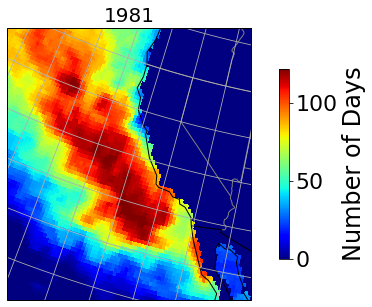

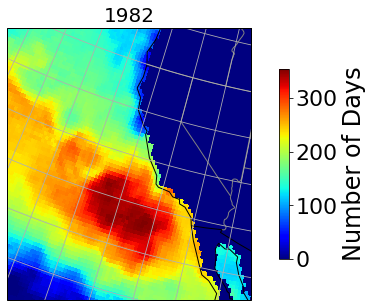

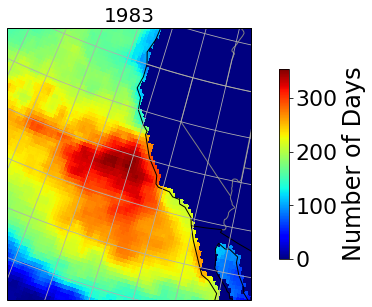

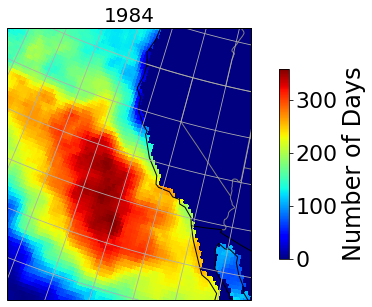

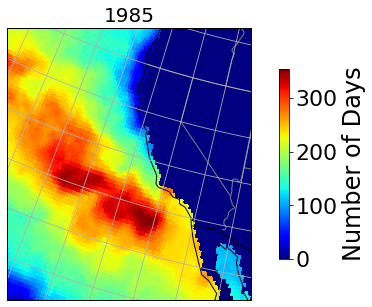

...

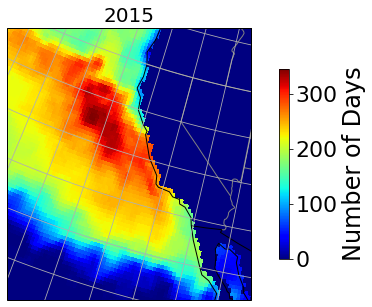

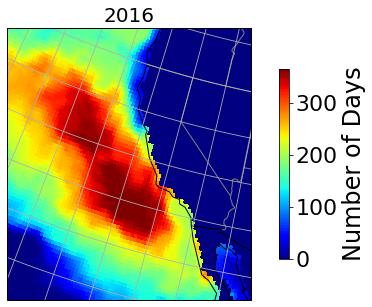

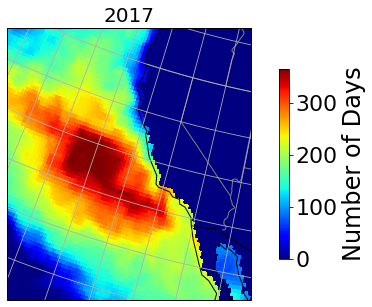

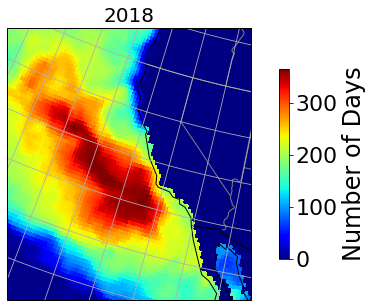

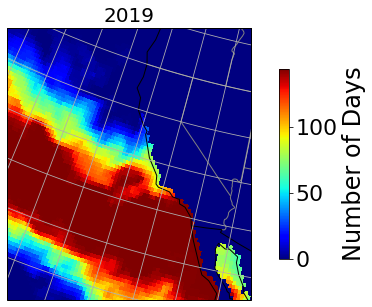

In [37]:
fig.suptitle('Daily averages between ' + str(min_Temp) + '\u00b0C and ' + str(max_Temp) + '\u00b0C',fontsize=32)
position=[]
count=1
for j in range(39):
    position.append(count)
    count=count+1

for ii in NOAA_Count.sst:
    #print(ii*NOAA_Mask[0,:,:])
    fig = plt.figure(figsize=[10,5])
    
    print(ii)

    # Plot the count_Mean data
    NOAA_Plot = fig.add_subplot(1,1,1,projection=crs.LambertConformal())
    NOAA_Plot.set_title(ii.year.data, fontsize=20)
    NOAA_Plot.set_extent([230,245,28,43], crs.Geodetic())
    NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, ii.data,
                 transform=crs.PlateCarree(),
                 cmap='jet')
    NOAA_Plot.add_feature(cfeature.COASTLINE)
    NOAA_Plot.add_feature(cfeature.LAND)
    NOAA_Plot.add_feature(cfeature.BORDERS)
    NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
    NOAA_Plot.gridlines()

    # Create a colorbar
    colorbar = fig.colorbar(NOAA_Colormesh, shrink=0.7, anchor=('SW'))
    colorbar.set_label('Number of Days',fontsize=24)
    colorbar.ax.tick_params(labelsize=22)
    
    #fig.savefig(r"D:\CRI_Modelling_PC\CRI Maps\HAB gif\ "+str(ii.year.data)+".tif", bbox_inches='tight')
    

In [25]:
for ii in NOAA_Count.sst:
    print(ii.year.data)
    
print(len(NOAA_Count.sst))

1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
39


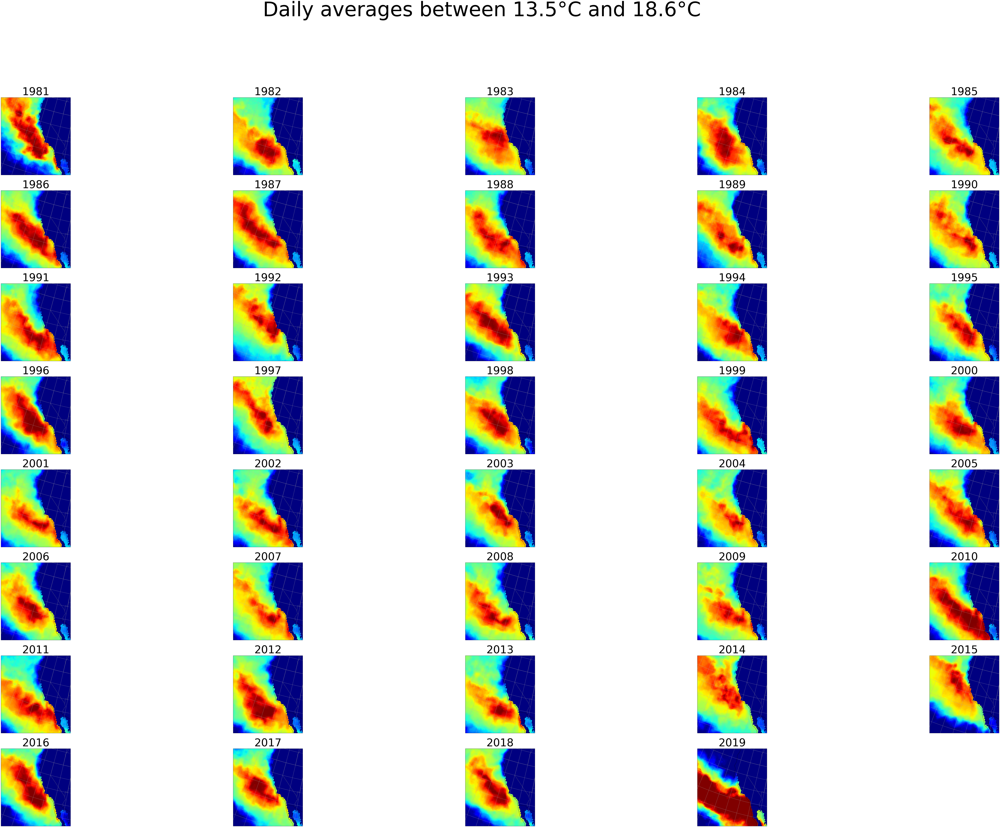

In [53]:
#print(ii*NOAA_Mask[0,:,:])
fig = plt.figure(figsize=[150,100])
fig.suptitle('Daily averages between ' + str(min_Temp) + '\u00b0C and ' + str(max_Temp) + '\u00b0C',fontsize=150)

count=1


for ii in NOAA_Count.sst:
    
    # Plot the count_Mean data
    NOAA_Plot = fig.add_subplot(8,5,count,projection=crs.LambertConformal())
    NOAA_Plot.set_title(ii.year.data, fontsize=80)
    NOAA_Plot.set_extent([230,245,28,43], crs.Geodetic())
    NOAA_Colormesh = NOAA_Plot.pcolormesh(lon, lat, ii.data,
                 transform=crs.PlateCarree(),
                 cmap='jet')
    NOAA_Plot.add_feature(cfeature.COASTLINE)
    NOAA_Plot.add_feature(cfeature.LAND)
    NOAA_Plot.add_feature(cfeature.BORDERS)
    NOAA_Plot.add_feature(states_provinces, edgecolor='gray')
    NOAA_Plot.gridlines()

    # Create a colorbar
    #colorbar = fig.colorbar(NOAA_Colormesh, shrink=0.7, anchor=('SW'))
    #colorbar.set_label('Number of Days',fontsize=24)
    #colorbar.ax.tick_params(labelsize=22)
    
    count=count+1
    
    #fig.savefig(r"D:\CRI_Modelling_PC\CRI Maps\HAB gif\ "+str(ii.year.data)+".tif", bbox_inches='tight')